In [ ]:
from SelfAttentionSegmentation import *
from Br35H import *
import pandas as pd

In [ ]:
img_size = (224, 224)
batch_size = 10
threshold = 0.9

In [ ]:
from sklearn.model_selection import train_test_split
indexer_df_train_val = pd.read_csv("indexer_df_train_val.csv", index_col=0)
indexer_df_test = pd.read_csv("indexer_df_test.csv", index_col=0)

train_index, val_index = train_test_split(
    indexer_df_train_val.index,
    test_size=0.2, random_state=42
)

In [ ]:
np.mean(indexer_df_train_val["label"] == 0), np.mean(indexer_df_test["label"] == 0)

(0.4981481481481482, 0.5166666666666667)

In [ ]:
indexer_df_train = indexer_df_train_val.loc[train_index]
indexer_df_val = indexer_df_train_val.loc[val_index]

global_branch_dataset_train = Br35HGlobalBranch(indexer_df_train, img_size, batch_size)
global_branch_dataset_val = Br35HGlobalBranch(indexer_df_val, img_size, batch_size)

In [ ]:
full_model = build_full_model(img_size)

In [ ]:
global_branch = full_model.get_layer("global_branch")
attention_branch = full_model.get_layer("attention_branch")
local_branch = full_model.get_layer("local_branch")

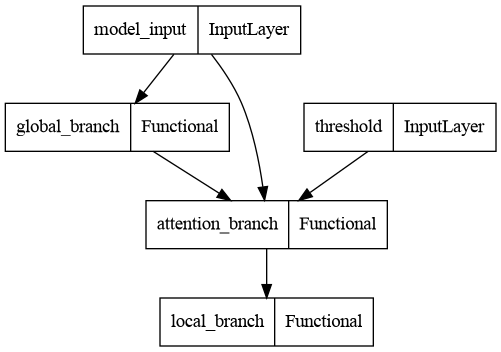

In [ ]:
tf.keras.utils.plot_model(full_model)

In [ ]:
(
    global_branch_history, local_branch_history,
    local_branch_dataset_train, local_branch_dataset_val
) = fit_full_model(
    full_model, global_branch_dataset_train, global_branch_dataset_val, threshold=0.9
)

Epoch 1/20
167/167 [==============================] - 21s 81ms/step - loss: 0.1959 - global_branch_class_pred_loss: 0.1959 - global_branch_class_pred_accuracy: 0.9222 - global_branch_class_pred_precision: 0.8819 - global_branch_class_pred_recall: 0.8976 - global_branch_class_pred_f1: 0.8708 - val_loss: 1.0246 - val_global_branch_class_pred_loss: 1.0246 - val_global_branch_class_pred_accuracy: 0.6275 - val_global_branch_class_pred_precision: 0.1375 - val_global_branch_class_pred_recall: 0.0640 - val_global_branch_class_pred_f1: 0.0822 - lr: 1.0000e-04
Epoch 2/20
167/167 [==============================] - 13s 76ms/step - loss: 0.0794 - global_branch_class_pred_loss: 0.0794 - global_branch_class_pred_accuracy: 0.9844 - global_branch_class_pred_precision: 0.9617 - global_branch_class_pred_recall: 0.9712 - global_branch_class_pred_f1: 0.9612 - val_loss: 7.0349 - val_global_branch_class_pred_loss: 7.0349 - val_global_branch_class_pred_accuracy: 0.3800 - val_global_branch_class_pred_precision

In [ ]:
def plot_history(history):
    fig, axs = plt.subplots(1, (len(history.history.keys())-1)//2, figsize=(30, 5))    
    for ax, (key, value) in zip(axs, history.history.items()):
        if key != "lr" and "val" not in key:
            ax.plot(value, label="Train")
            ax.plot(history.history[f"val_{key}"], label="Val")
            ax.set_title(key)
            ax.legend()
    plt.show()
            

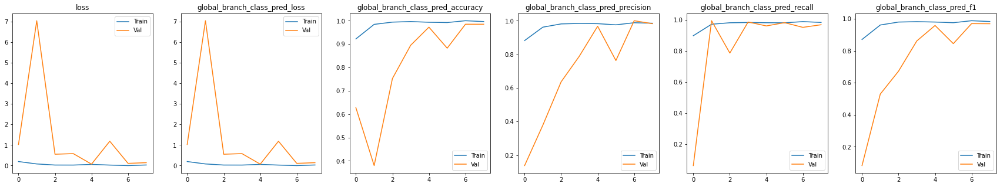

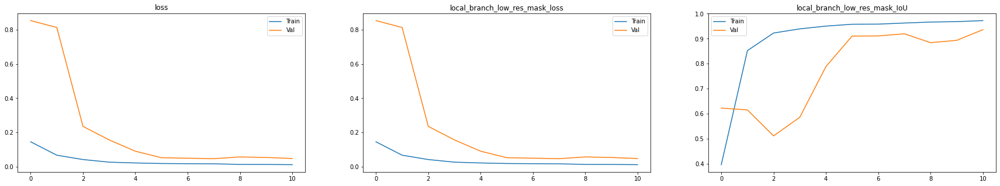

In [ ]:
plot_history(global_branch_history)
plot_history(local_branch_history)

In [ ]:
global_branch_dataset_test = Br35HGlobalBranch(indexer_df_test, img_size, batch_size)
local_branch_dataset_test = Br35HLocalBranch(global_branch_dataset_test, global_branch, attention_branch, threshold=threshold)

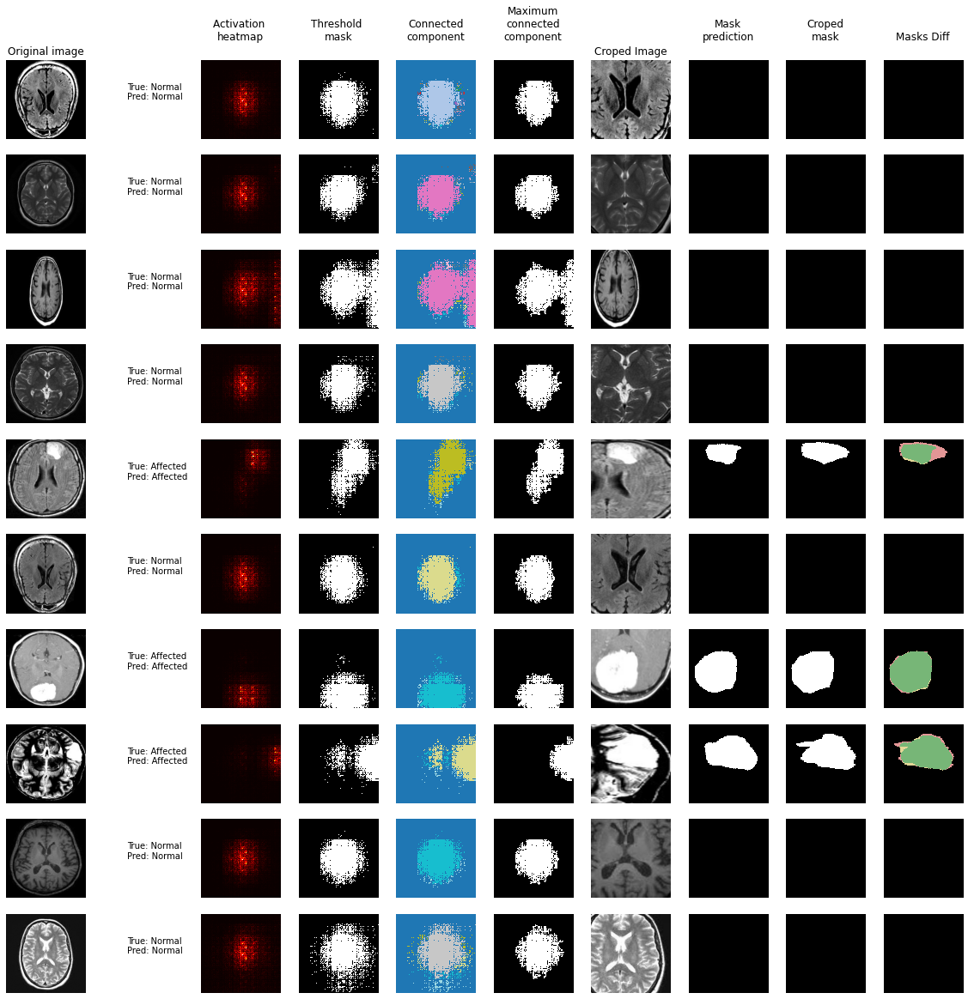

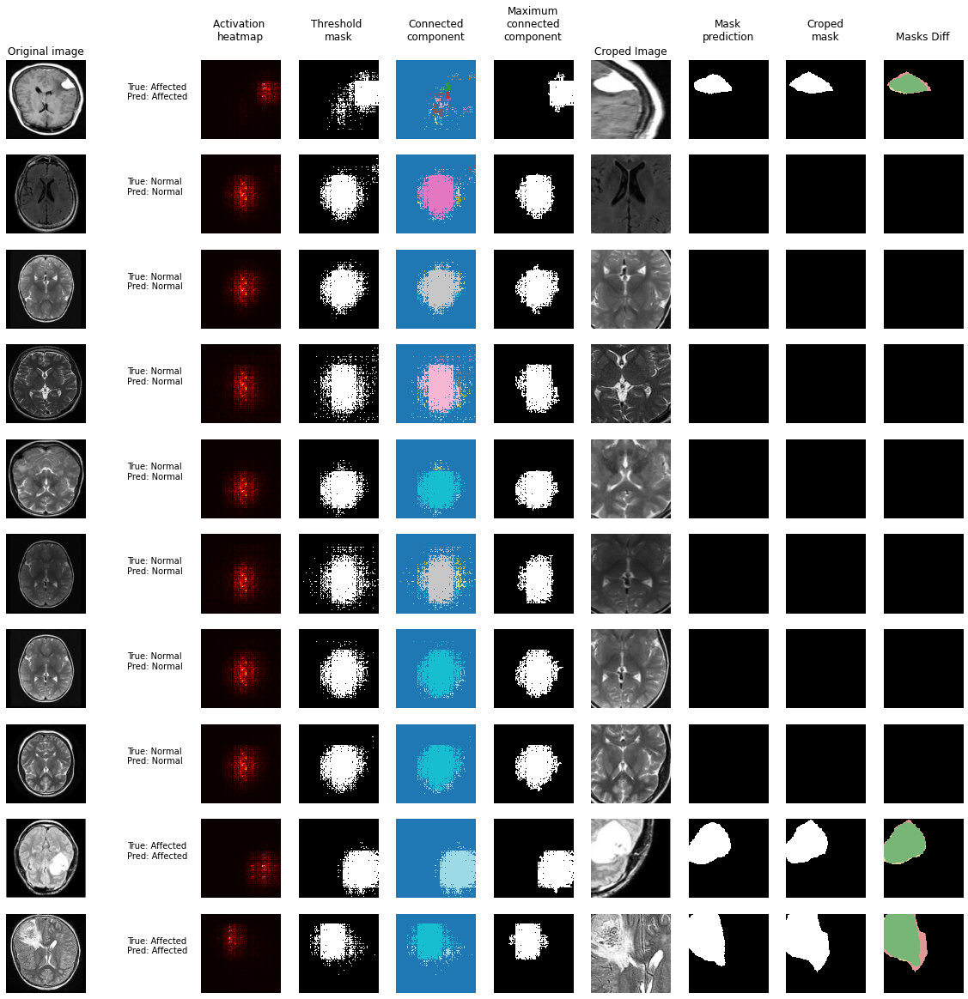

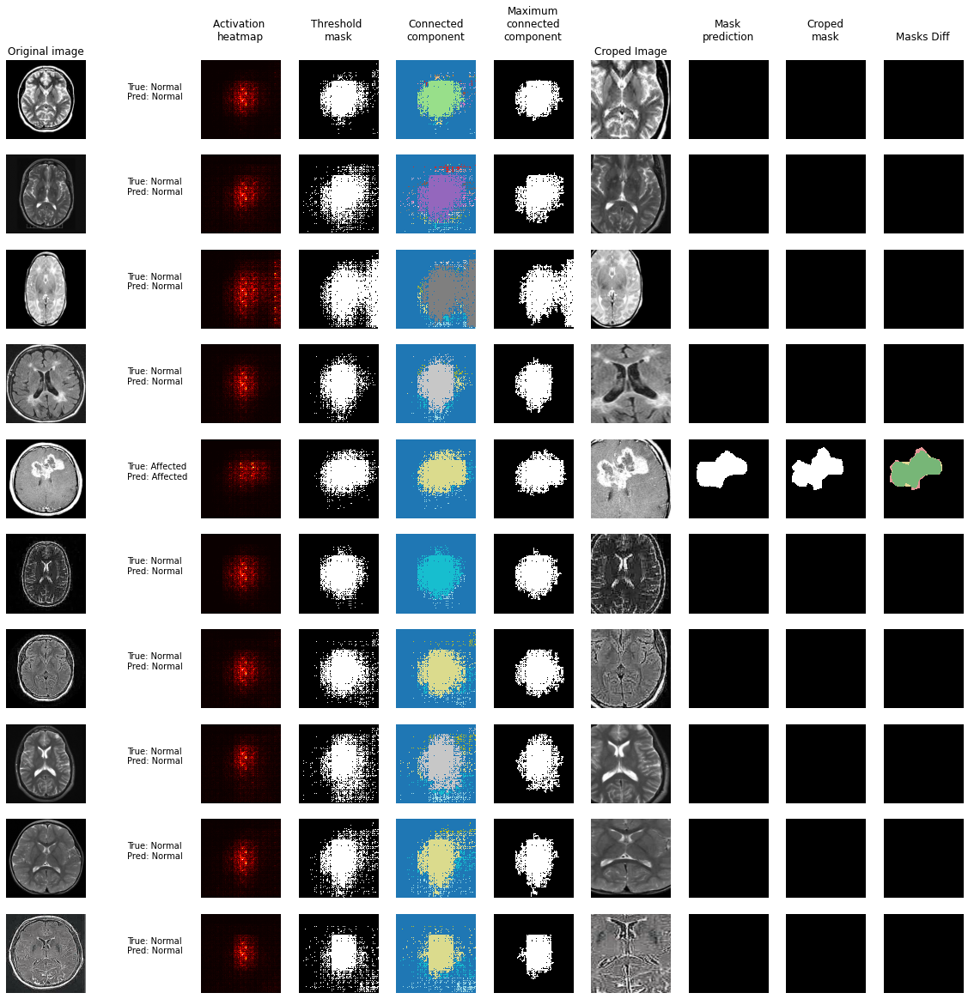

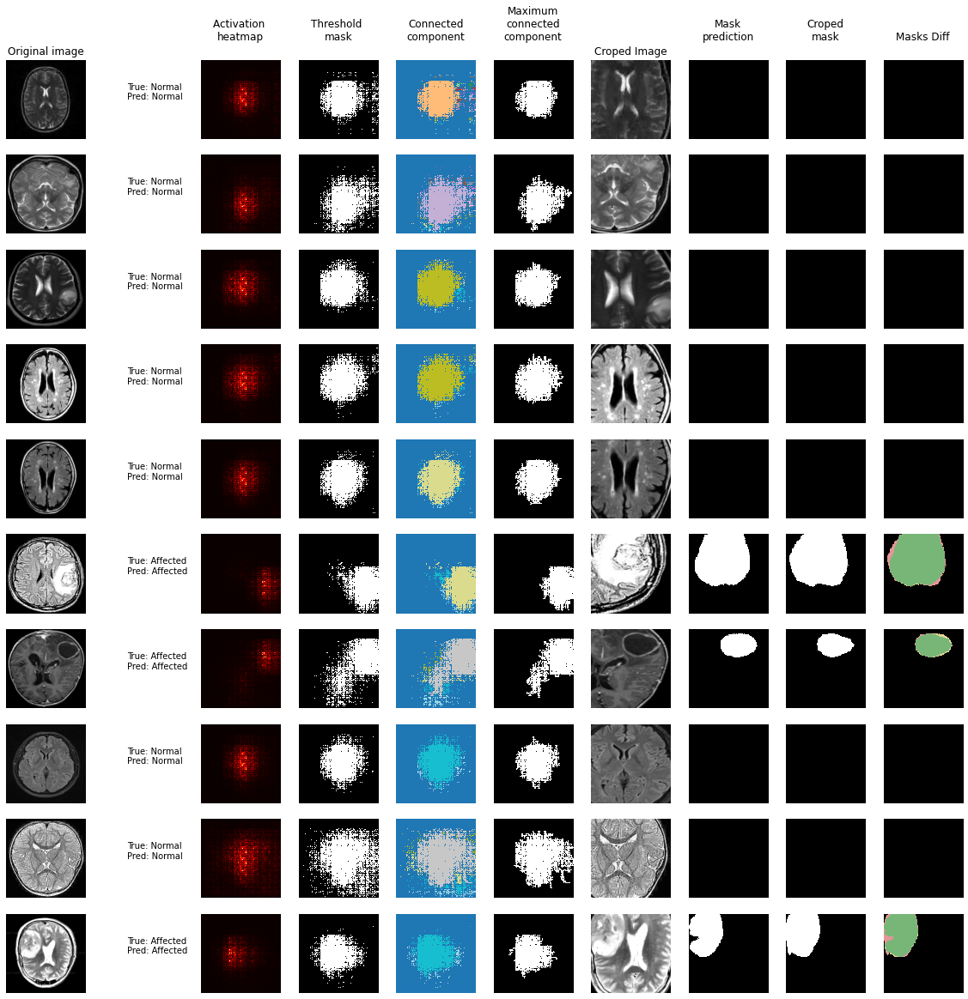

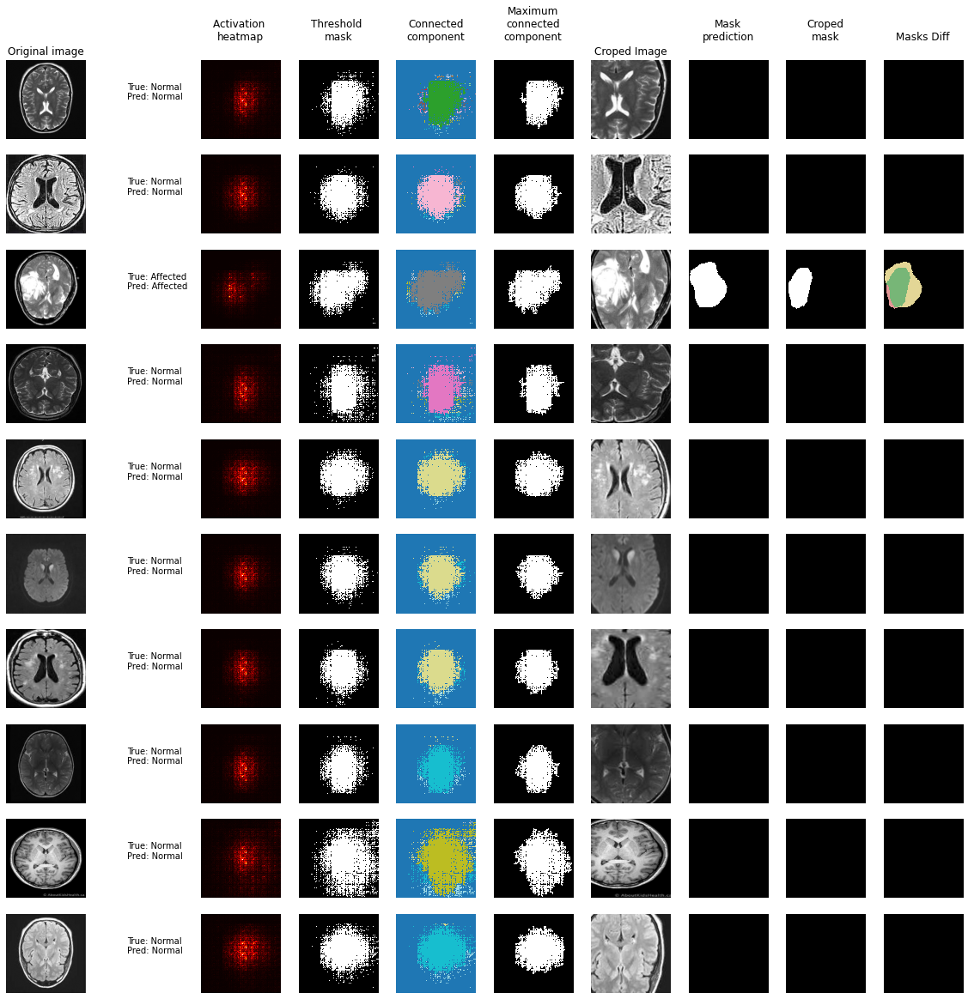

...

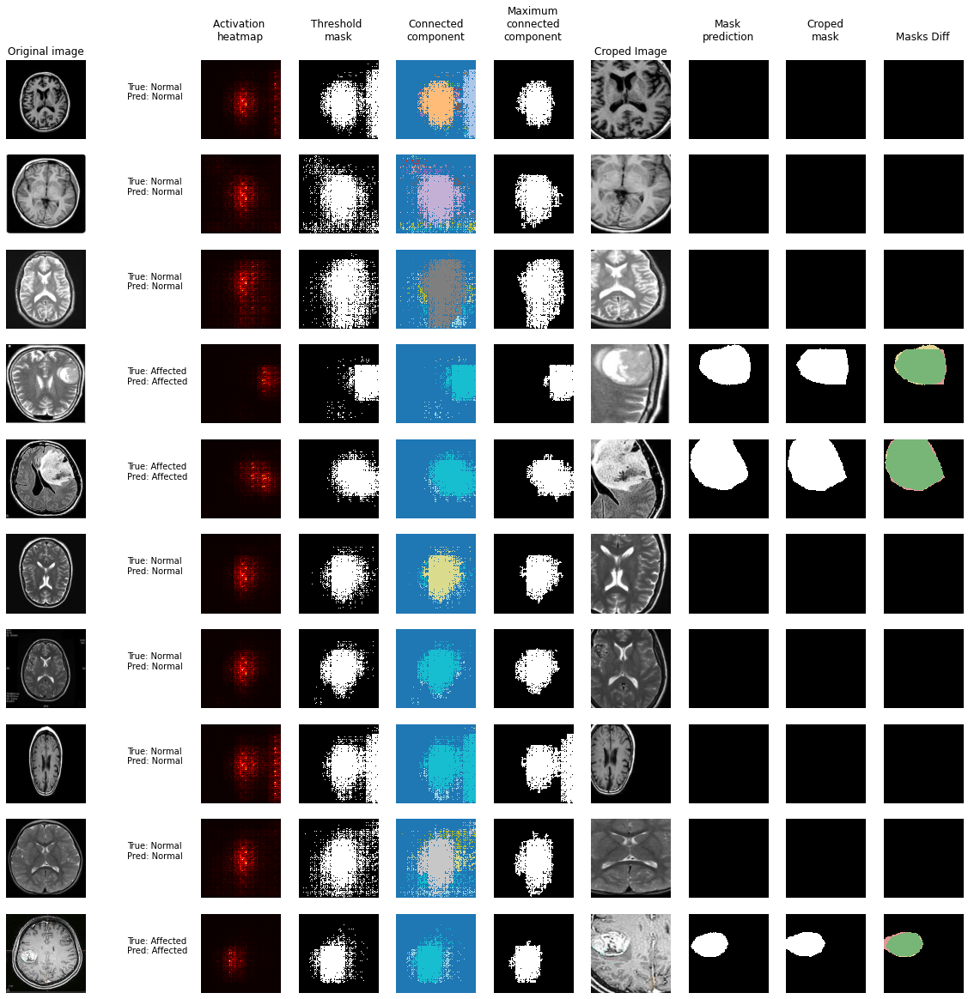

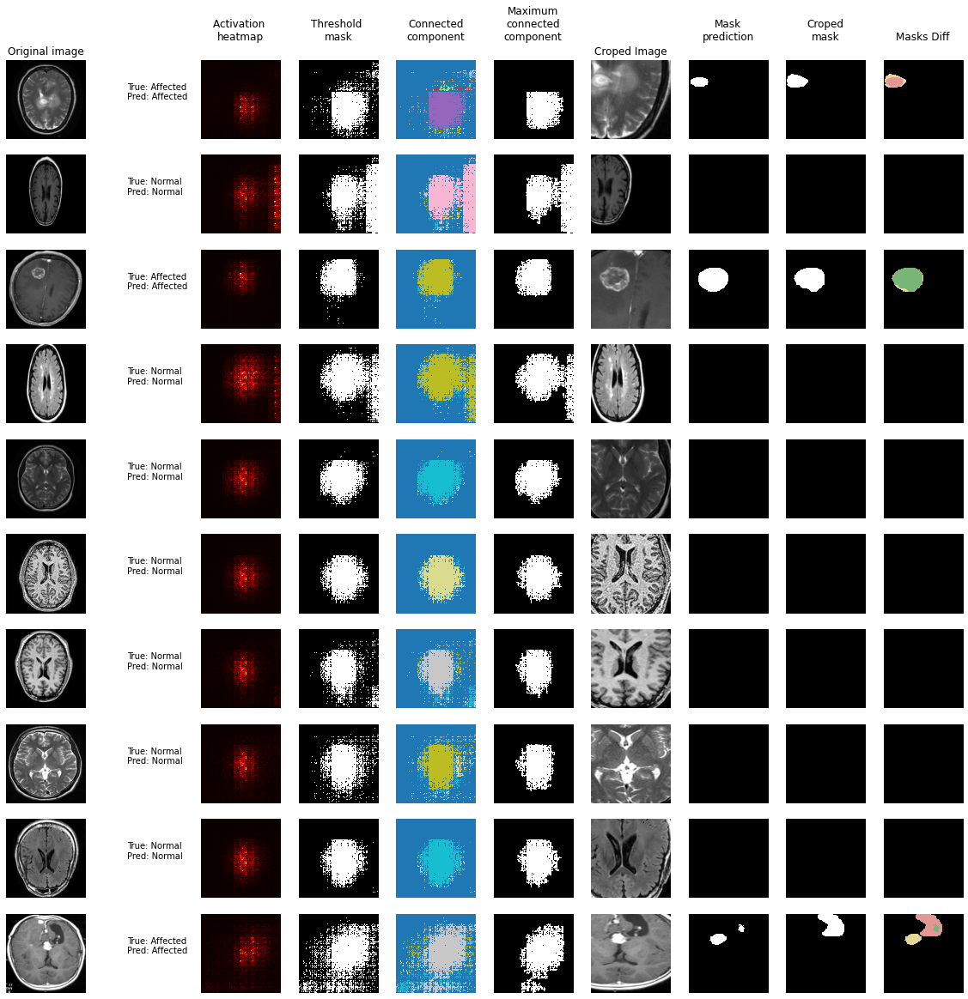

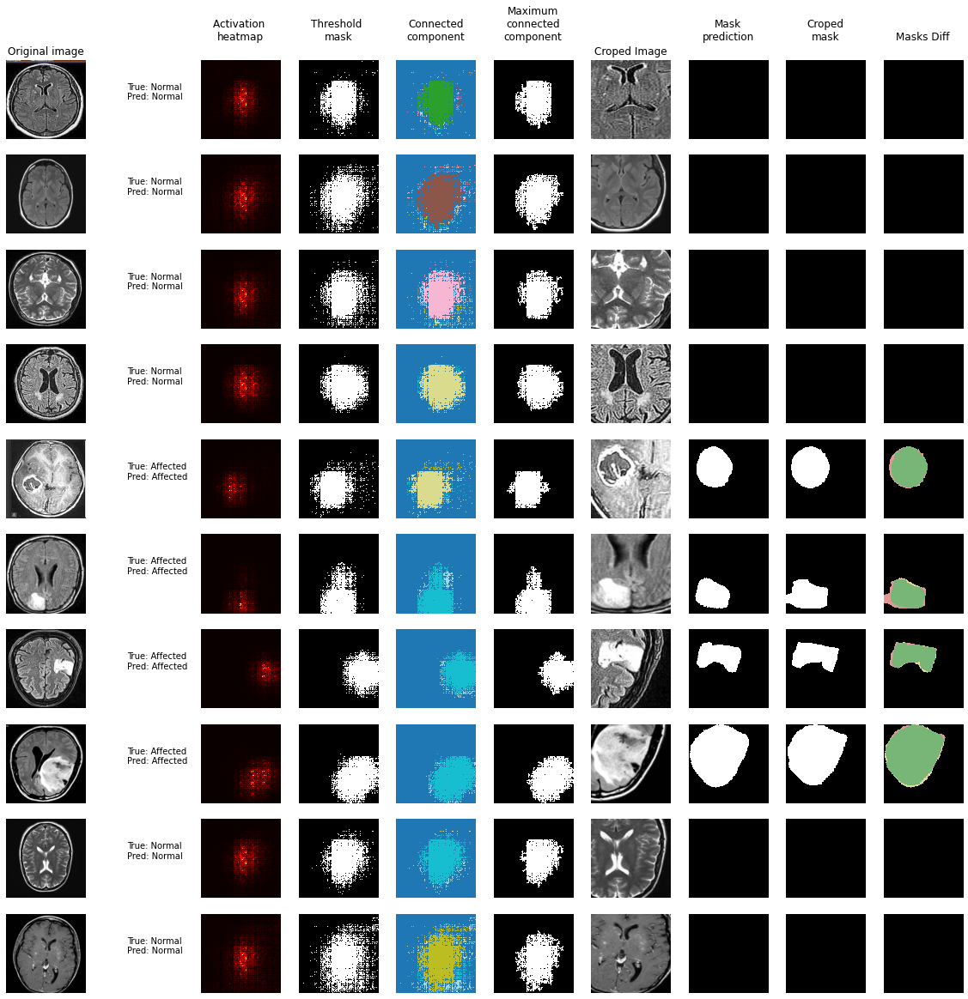

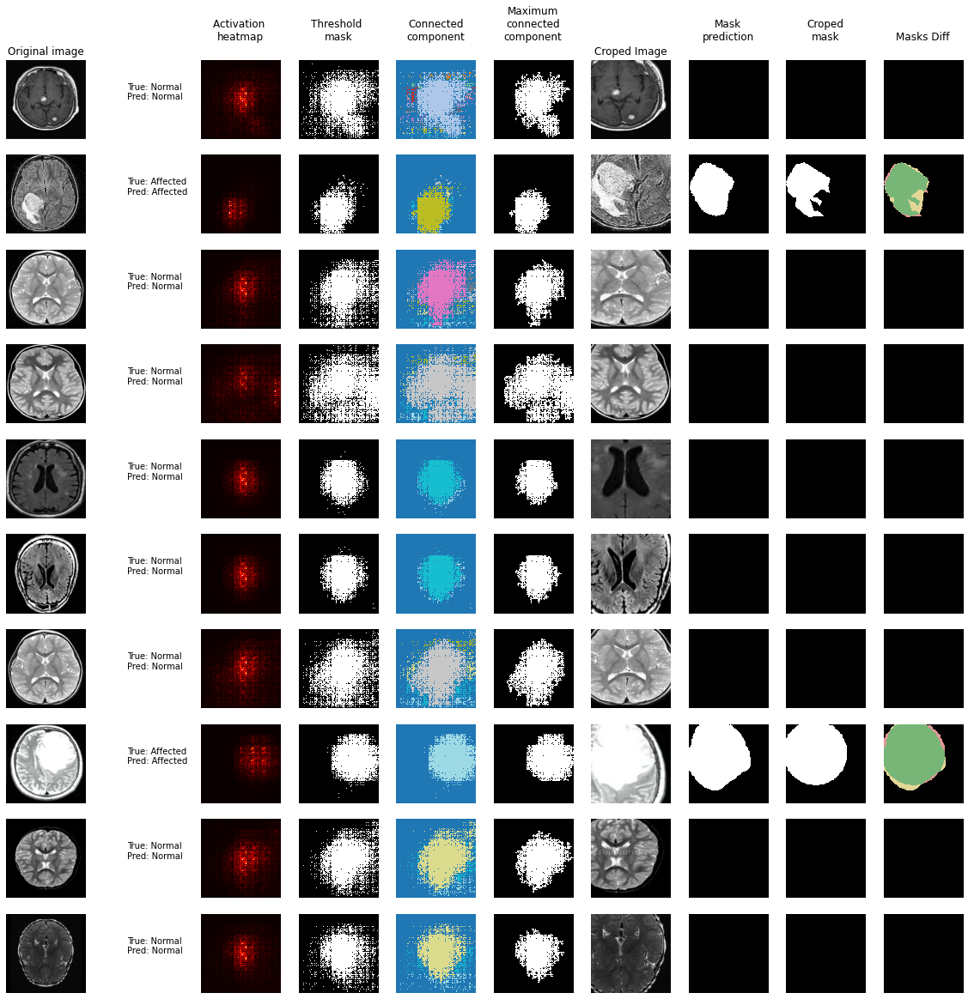

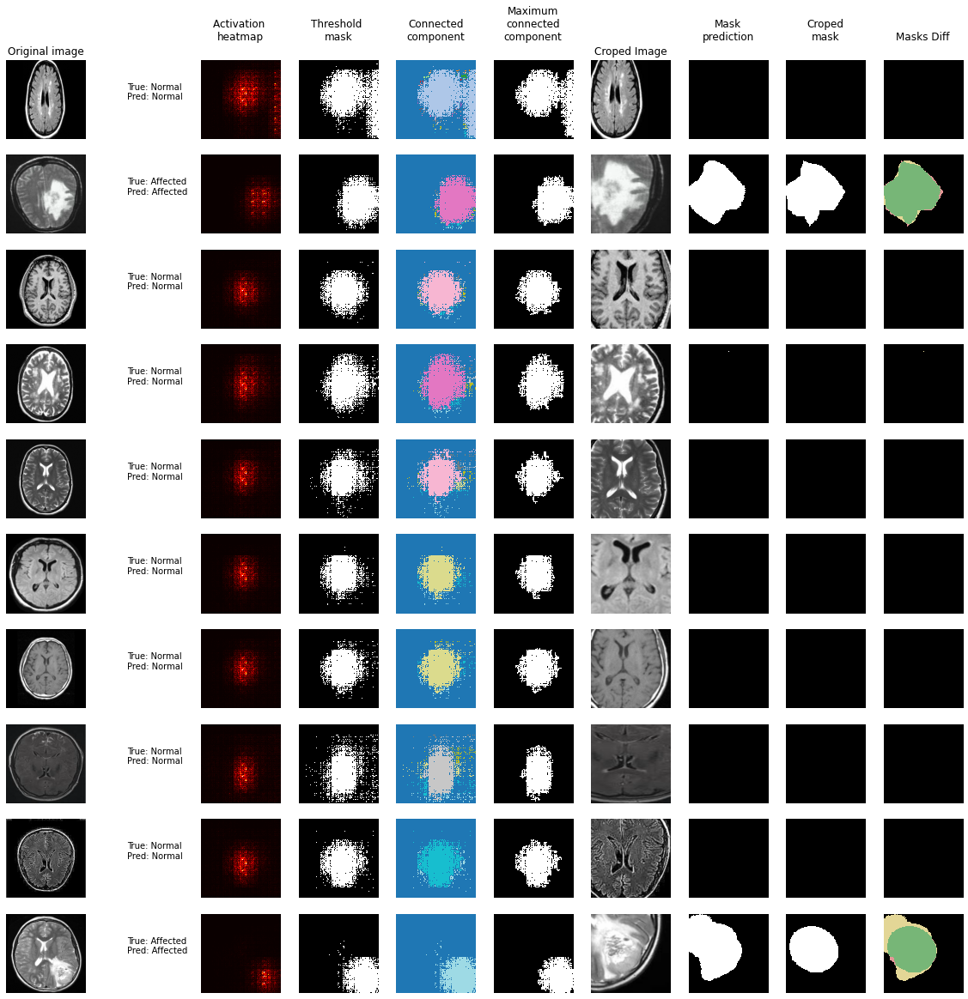

In [ ]:
from matplotlib.colors import LinearSegmentedColormap
# FP TN TP FN
cmap = LinearSegmentedColormap.from_list("", [(0, 0, 0), (0.47, 0.714, 0.47), (0.894, 0.59, 0.59), (0.894, 0.843, 0.59)] , N=4)
for batch in local_branch_dataset_test.__iter__(return_all=True):
    fig, axs = plt.subplots(10, 10, figsize=(20, 20))    
    indexs, imgs, labels, _, masks, global_branch_latents, croped_imgs, croped_masks = batch.values()
    thresholds = np.ones((batch_size, 112, 112)) * threshold
    
    outputs = full_model([imgs, thresholds])
    
    pred_labels = outputs["global_branch_class_pred"]
    
    threshold_masks = outputs["threshold_mask"]
    connected_components = outputs["connected_components"]
    maximum_connected_components = outputs["maximum_connected_component"]
    
    local_branch_mask_preds = outputs["local_branch_low_res_mask_pred"]
    
    axs[0][0].set_title("Original image")
    axs[0][1].set_title("")
    
    axs[0][2].set_title("Activation \nheatmap")
    axs[0][3].set_title("Threshold \nmask")
    axs[0][4].set_title("Connected\ncomponent")
    axs[0][5].set_title("Maximum\nconnected\ncomponent")
    
    axs[0][6].set_title("Croped Image")
    axs[0][7].set_title("Mask\nprediction")
    axs[0][8].set_title("Croped\nmask")
    axs[0][9].set_title("Masks Diff")

    for i in range(batch_size):
        for j in range(10):
            axs[i][j].set_axis_off()
        axs[i][0].imshow(imgs[i])
        label = "Normal" if labels[i] == 0 else "Affected"
        pred_label = "Normal" if np.argmax(pred_labels[i]) == 0 else "Affected"
        axs[i][1].text(0.3, 0.5, f"True: {label}\nPred: {pred_label}")
        
        axs[i][2].matshow(outputs["heatmap"][i], cmap="hot")
        axs[i][3].matshow(threshold_masks[i], cmap="gray")
        axs[i][4].matshow(connected_components[i], cmap="tab20")
        axs[i][5].matshow(maximum_connected_components[i], cmap="gray")
        
        axs[i][6].imshow(croped_imgs[i])
        axs[i][7].matshow(local_branch_mask_preds[i], cmap="gray")
        axs[i][8].matshow(croped_masks[i], cmap="gray")
        axs[i][9].matshow(np.where(2*croped_masks[i]-local_branch_mask_preds[i] < 0, 3, 2*croped_masks[i]-local_branch_mask_preds[i]), cmap=cmap)
            
    plt.show()

In [ ]:
global_branch.evaluate(global_branch_dataset_test)

22/22 [==============================] - 1s 22ms/step - loss: 0.0115 - global_branch_class_pred_loss: 0.0115 - global_branch_class_pred_accuracy: 1.0000 - global_branch_class_pred_precision: 1.0000 - global_branch_class_pred_recall: 1.0000 - global_branch_class_pred_f1: 1.0000


[0.01147190760821104, 0.01147190760821104, 1.0, 1.0, 1.0, 1.0]

In [ ]:
local_branch.evaluate(local_branch_dataset_test)

22/22 [==============================] - 2s 82ms/step - loss: 0.0290 - local_branch_low_res_mask_loss: 0.0290 - local_branch_low_res_mask_IoU: 0.9469


[0.028987130150198936, 0.028987130150198936, 0.9469171166419983]